In [1]:
import numpy as np
import pandas as pd
import os
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms , models 
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchsummary import summary
import glob
from torch.utils.data import Dataset , DataLoader
import cv2
from copy import deepcopy

In [2]:
def train_batch(x ,y , model , loss_fn , optimizer):
    model.train()
    y_pred = model(x)
    loss = loss_fn(y_pred , y)
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    return loss.item()
@torch.no_grad()
def calc_loss(x , y , loss_fn , model):
    model.eval()
    predictions = model(x)
    loss_value = loss_fn(predictions, y)
    return loss_value.item()

In [3]:
root_training_dir = "P1_Facial_Keypoints/data/training/"
root_test_dir = "P1_Facial_Keypoints/data/test/"
train_info_dir ="P1_Facial_Keypoints/data/training_frames_keypoints.csv"
test_info_dir = "P1_Facial_Keypoints/data/test_frames_keypoints.csv"

In [4]:
class FaceDatas(Dataset):
    def __init__(self , root_image , root_info):
        super(FaceDatas ,self).__init__()
        self.root_info = root_info 
        self.root_image = root_image
        all_images = glob.glob(os.path.join(self.root_image , "*.jpg"))
        self.df = pd.read_csv(self.root_info)
        self.normalize = transforms.Normalize(mean=[0.485 , 0.456 , 0.406] , 
                                              std =[0.229 , 0.224 , 0.225])
        
    def __len__(self):
        return len(self.df)
    def __getitem__(self , ix):
        img_path = os.path.join(self.root_image , self.df.iloc[ix ,0])
        img = cv2.imread(img_path)[:,:,::-1]/255.0
        kp = deepcopy(self.df.iloc[ix,1:].to_list())
        kp_x = (np.array(kp[0::2]).astype(float)/img.shape[1]).tolist()
        kp_y = (np.array(kp[1::2]).astype(float)/img.shape[0]).tolist()
        kp = kp_x + kp_y
        kp = torch.Tensor(kp)
        img = self.preprocess_input(img)
        return img , kp
    def preprocess_input(self , img):
        img = cv2.resize(img , (224,224))
        img = torch.Tensor(img).permute(2, 0, 1)
        img = self.normalize(img)
        return img 

In [5]:
all_train = pd.read_csv(train_info_dir)
all_train.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,126,127,128,129,130,131,132,133,134,135
0,Luis_Fonsi_21.jpg,45.0,98.0,47.0,106.0,49.0,110.0,53.0,119.0,56.0,...,83.0,119.0,90.0,117.0,83.0,119.0,81.0,122.0,77.0,122.0
1,Lincoln_Chafee_52.jpg,41.0,83.0,43.0,91.0,45.0,100.0,47.0,108.0,51.0,...,85.0,122.0,94.0,120.0,85.0,122.0,83.0,122.0,79.0,122.0
2,Valerie_Harper_30.jpg,56.0,69.0,56.0,77.0,56.0,86.0,56.0,94.0,58.0,...,79.0,105.0,86.0,108.0,77.0,105.0,75.0,105.0,73.0,105.0
3,Angelo_Reyes_22.jpg,61.0,80.0,58.0,95.0,58.0,108.0,58.0,120.0,58.0,...,98.0,136.0,107.0,139.0,95.0,139.0,91.0,139.0,85.0,136.0
4,Kristen_Breitweiser_11.jpg,58.0,94.0,58.0,104.0,60.0,113.0,62.0,121.0,67.0,...,92.0,117.0,103.0,118.0,92.0,120.0,88.0,122.0,84.0,122.0


In [6]:
all_train.shape

(3462, 137)

In [7]:
from sklearn.model_selection import train_test_split
train ,test = train_test_split(all_train , test_size=0.1 , shuffle=True , random_state=42)

In [8]:
train.to_csv("P1_Facial_Keypoints/data/train.csv", index=False)
test.to_csv("P1_Facial_Keypoints/data/validation.csv", index=False)
pd.read_csv("P1_Facial_Keypoints/data/train.csv").head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,126,127,128,129,130,131,132,133,134,135
0,Gene_Hackman_30.jpg,60.0,62.0,61.0,67.0,62.0,72.0,63.0,77.0,66.0,...,92.0,81.0,94.0,81.0,92.0,82.0,91.0,82.0,88.0,82.0
1,Laura_Bush_42.jpg,161.0,157.0,156.0,175.0,156.0,193.0,156.0,211.0,161.0,...,209.0,238.0,227.0,238.0,209.0,238.0,201.0,238.0,196.0,238.0
2,Ahmed_Ahmed_00.jpg,122.0,157.0,122.0,175.0,125.0,186.0,129.0,201.0,136.0,...,173.0,209.0,192.0,206.0,173.0,213.0,170.0,216.0,162.0,216.0
3,Jacqueline_Gold_32.jpg,23.0,64.0,25.0,71.0,26.0,77.0,28.0,82.0,33.0,...,69.0,79.0,71.0,77.0,71.0,83.0,67.0,85.0,64.0,84.0
4,Fernando_Henrique_Cardoso_02.jpg,26.0,72.0,26.0,78.0,27.0,83.0,29.0,89.0,32.0,...,64.0,93.0,66.0,94.0,64.0,94.0,63.0,94.0,60.0,94.0


In [9]:
training_dir = "P1_Facial_Keypoints/data/train.csv"
validation_dir = "P1_Facial_Keypoints/data/validation.csv"


In [10]:
train_set = FaceDatas(root_training_dir , training_dir)
valid_set = FaceDatas(root_training_dir , validation_dir)

In [11]:
train_loader = DataLoader(train_set , batch_size=32, shuffle=True)
test_loader = DataLoader(valid_set , batch_size=128)

In [23]:
images , keys = next(iter(train_loader))

In [25]:
images.shape , keys.shape

(torch.Size([64, 3, 224, 224]), torch.Size([64, 136]))

In [34]:
8*8

64

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

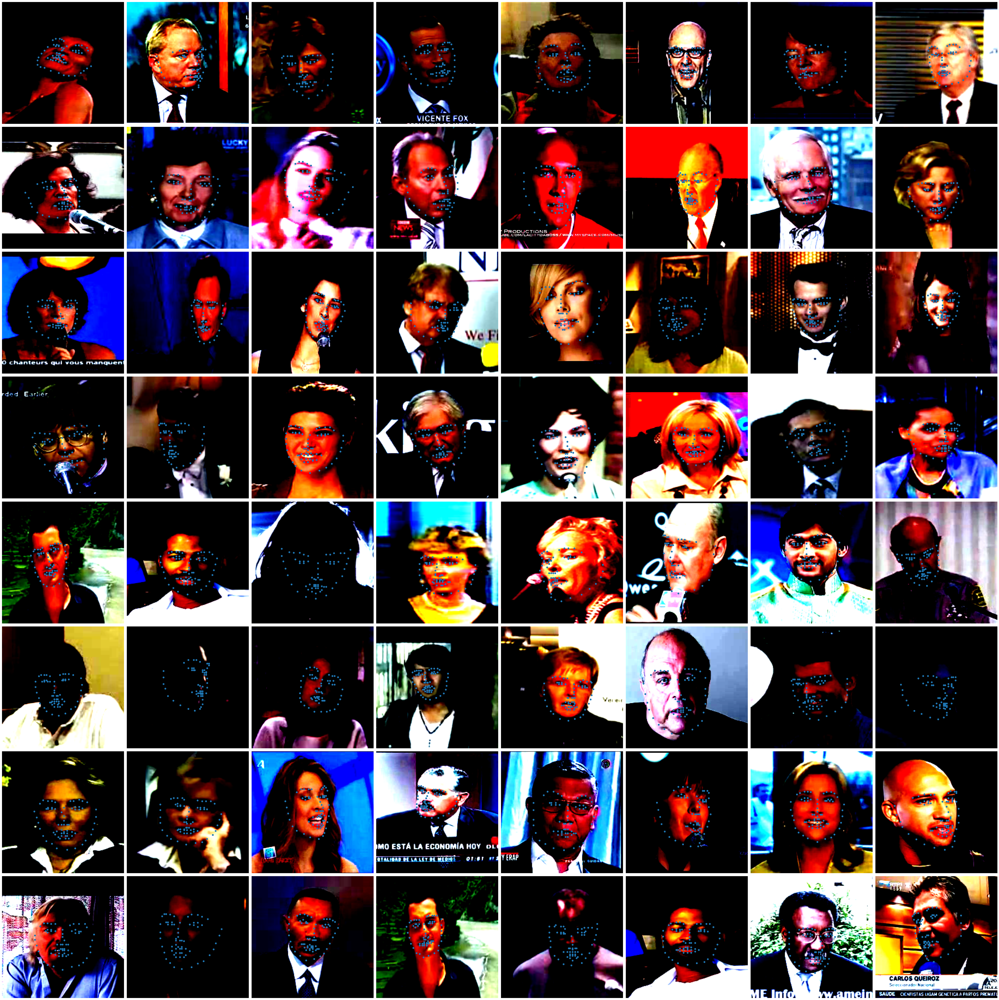

In [36]:
num_points = 68
fig, axes = plt.subplots(8, 8, figsize=(50, 50))
axes = axes.flatten()
for i in range(64):
    axes[i].imshow(images[i].permute(1, 2, 0).numpy())
    point_key = keys[i].numpy()*224
    axes[i].scatter(point_key[:num_points],point_key[num_points:] ,s=30)
    axes[i].axis("off")
plt.tight_layout()
plt.show()

In [41]:
#train vgg16
def get_model():
    model = models.vgg16(weights=models.VGG16_Weights.DEFAULT)
    for param in model.features.parameters():
        param.requires_grad = False # freeze not changes during learning 
    model.avgpool = nn.Sequential(
        nn.Conv2d(512 , 512 , 3),
        nn.ReLU(),
        nn.MaxPool2d(2),
        nn.Flatten() #we need to take location on our mind
    )
    model.classifier = nn.Sequential(
        nn.Linear(2048, 512),
        nn.ReLU(),
        nn.Dropout(0.5),
        nn.Linear(512 , 136),
        nn.Sigmoid()
    )
    loss_fn = nn.L1Loss() 
    optimizer = torch.optim.Adam(model.parameters() , lr=1e-3)
    return model , loss_fn ,optimizer

In [42]:
model , loss_fn , optimizer = get_model()

In [12]:
def train(model , train_loader , test_loader , optimizer , loss_fn , epochs):
    model.train()
    #train_acc , val_acc =[], []
    train_loss , val_loss = [], []
    for e in range(epochs):
        model.train()
        #train_b_acc ,val_b_acc =[], []
        train_b_loss ,val_b_loss =[],[]
        for x , y in train_loader:
            loss = train_batch(x , y , model , loss_fn ,optimizer)
           # acc = accuracy(x, y, model)
            #train_b_acc.append(acc.numpy())
            train_b_loss.append(loss)

        for x , y in test_loader:
           # acc = accuracy(x, y , model)
            loss = calc_loss(x , y, loss_fn , model)
            val_b_loss.append(loss)
            #val_b_acc.append(acc.numpy())
       # val_acc.append(np.array(val_b_acc).mean())
        val_loss.append(np.array(val_b_loss).mean())
        #train_acc.append(np.array(train_b_acc).mean())
        train_loss.append(np.array(train_b_loss).mean())
        print(f"Epoch {e+1} Train Loss : {train_loss[-1]:0.4f}  Val Loss {val_loss[-1]:0.3f} ")
    return   train_loss  , val_loss


In [44]:
try :
    train_loss ,  val_loss =  train(model , train_loader , test_loader , optimizer , loss_fn , 20)
except KeyboardInterrupt:
    print("model stop suddenly")

Epoch 1 Train Loss : 0.0512  Val Loss 0.034 
Epoch 2 Train Loss : 0.0330  Val Loss 0.027 
Epoch 3 Train Loss : 0.0274  Val Loss 0.024 
Epoch 4 Train Loss : 0.0250  Val Loss 0.024 
Epoch 5 Train Loss : 0.0227  Val Loss 0.022 
Epoch 6 Train Loss : 0.0213  Val Loss 0.021 
Epoch 7 Train Loss : 0.0206  Val Loss 0.021 
Epoch 8 Train Loss : 0.0201  Val Loss 0.021 
Epoch 9 Train Loss : 0.0194  Val Loss 0.020 
Epoch 10 Train Loss : 0.0188  Val Loss 0.022 
Epoch 11 Train Loss : 0.0181  Val Loss 0.020 
Epoch 12 Train Loss : 0.0177  Val Loss 0.019 
Epoch 13 Train Loss : 0.0176  Val Loss 0.019 
Epoch 14 Train Loss : 0.0170  Val Loss 0.020 
Epoch 15 Train Loss : 0.0168  Val Loss 0.019 
Epoch 16 Train Loss : 0.0165  Val Loss 0.019 
Epoch 17 Train Loss : 0.0162  Val Loss 0.019 
Epoch 18 Train Loss : 0.0162  Val Loss 0.019 
Epoch 19 Train Loss : 0.0159  Val Loss 0.019 
Epoch 20 Train Loss : 0.0156  Val Loss 0.019 


In [12]:
x, y = next(iter(test_loader))

In [ ]:
[3 , 224 , 224]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

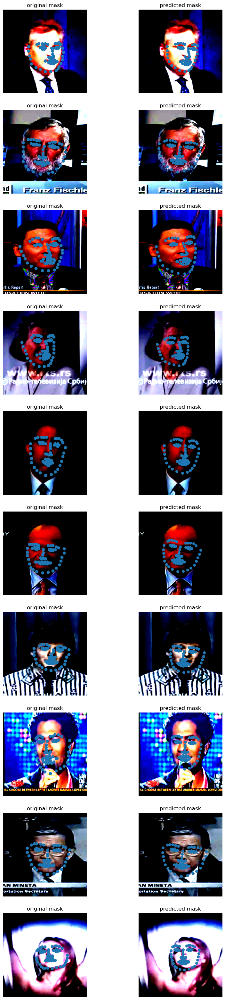

In [49]:
fig , axes = plt.subplots(10 , 2 , figsize=(10,40))
for ix , plot_row in enumerate(axes):
    for index , plot in enumerate(plot_row):
        if index == 0:
            plot.imshow(x[ix].permute(1,2,0).numpy())
            plot.scatter(y[ix][:68]*224 , y[ix][68:]*224)
            plot.set_title("original mask")
        elif index == 1:
            kp = model(x[ix].unsqueeze(0)).detach().numpy().flatten()
            plot.imshow(x[ix].permute(1,2,0).numpy())
            plot.scatter(kp[:68]*224 , kp[68:]*224, s=30)
            plot.set_title("predicted mask")
        plot.axis("off")
        plot.grid(False)
plt.axis("off")
plt.show()


In [50]:
torch.save(model, "facial_modelv2.pt")

In [16]:
model = torch.load("facial_modelv2.pt")